In [1]:
pip install pgeocode

Note: you may need to restart the kernel to use updated packages.


In [2]:
!pip install folium

In [3]:
# !pip install geopy

In [4]:
# !pip install shapely

In [5]:
# pip install pandas geopandas folium tqdm geopy

In [6]:
# !pip install imbalanced-learn

# 1. Import libraries

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB               
from sklearn.naive_bayes import ComplementNB
from sklearn.naive_bayes import BernoulliNB                   
from sklearn.naive_bayes import CategoricalNB
from sklearn import metrics
import warnings 
warnings.filterwarnings('ignore')
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
import seaborn as sns
import plotly.express as px
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression      
from sklearn import metrics
from sklearn.model_selection import train_test_split 
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import KFold
from sklearn.metrics import log_loss
import pgeocode
import os
import folium
from tqdm import tqdm
from geopy.geocoders import Nominatim
from shapely.geometry import Point
import geopandas as gpd
from shapely.geometry import Point
import folium
from itertools import combinations
import itertools
from imblearn.over_sampling import SMOTE
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# 2. Data Pre-Processing

## 2.1. Import dataset

In [8]:
data= pd.read_csv('/kaggle/input/bank-personal-loan-modelling/Bank_Personal_Loan_Modelling.csv')
data

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
0,1,25,1,49,91107,4,1/60,1,0,0,1,0,0,0
1,2,45,19,34,90089,3,1/50,1,0,0,1,0,0,0
2,3,39,15,11,94720,1,1/00,1,0,0,0,0,0,0
3,4,35,9,100,94112,1,2/70,2,0,0,0,0,0,0
4,5,35,8,45,91330,4,1/00,2,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,4996,29,3,40,92697,1,1/90,3,0,0,0,0,1,0
4996,4997,30,4,15,92037,4,0/40,1,85,0,0,0,1,0
4997,4998,63,39,24,93023,2,0/30,3,0,0,0,0,0,0
4998,4999,65,40,49,90034,3,0/50,2,0,0,0,0,1,0


## 2.2. Convert to dataframe

In [9]:
df = pd.DataFrame(data)
df

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
0,1,25,1,49,91107,4,1/60,1,0,0,1,0,0,0
1,2,45,19,34,90089,3,1/50,1,0,0,1,0,0,0
2,3,39,15,11,94720,1,1/00,1,0,0,0,0,0,0
3,4,35,9,100,94112,1,2/70,2,0,0,0,0,0,0
4,5,35,8,45,91330,4,1/00,2,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,4996,29,3,40,92697,1,1/90,3,0,0,0,0,1,0
4996,4997,30,4,15,92037,4,0/40,1,85,0,0,0,1,0
4997,4998,63,39,24,93023,2,0/30,3,0,0,0,0,0,0
4998,4999,65,40,49,90034,3,0/50,2,0,0,0,0,1,0


## 2.3. Replace "/" with "." for 'CCAvg' column

In [10]:
df['CCAvg']=df['CCAvg'].str.replace("/",".")

## 2.4. Get data information

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   ID                  5000 non-null   int64 
 1   Age                 5000 non-null   int64 
 2   Experience          5000 non-null   int64 
 3   Income              5000 non-null   int64 
 4   ZIP Code            5000 non-null   int64 
 5   Family              5000 non-null   int64 
 6   CCAvg               5000 non-null   object
 7   Education           5000 non-null   int64 
 8   Mortgage            5000 non-null   int64 
 9   Personal Loan       5000 non-null   int64 
 10  Securities Account  5000 non-null   int64 
 11  CD Account          5000 non-null   int64 
 12  Online              5000 non-null   int64 
 13  CreditCard          5000 non-null   int64 
dtypes: int64(13), object(1)
memory usage: 547.0+ KB


## 2.5. Convert "CCAvg" type from object to float

In [12]:
df["CCAvg"] = df["CCAvg"].astype(str).astype(float)

## 2.6. Data description

In [13]:
desc = df.describe()
styled_desc = desc.style.background_gradient(cmap='Reds')
styled_desc

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,2500.500000,45.338400,20.104600,73.774200,93152.503000,2.396400,1.937938,1.881000,56.498800,0.096000,0.104400,0.060400,0.596800,0.294000
std,1443.520003,11.463166,11.467954,46.033729,2121.852197,1.147663,1.747659,0.839869,101.713802,0.294621,0.305809,0.238250,0.490589,0.455637
min,1.000000,23.000000,-3.000000,8.000000,9307.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1250.750000,35.000000,10.000000,39.000000,91911.000000,1.000000,0.700000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2500.500000,45.000000,20.000000,64.000000,93437.000000,2.000000,1.500000,2.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
75%,3750.250000,55.000000,30.000000,98.000000,94608.000000,3.000000,2.500000,3.000000,101.000000,0.000000,0.000000,0.000000,1.000000,1.000000
max,5000.000000,67.000000,43.000000,224.000000,96651.000000,4.000000,10.000000,3.000000,635.000000,1.000000,1.000000,1.000000,1.000000,1.000000


## 2.7. Check hidden characters in column's name

In [14]:
for col in df.columns:
    print(repr(col))

'ID'
'Age'
'Experience'
'Income'
'ZIP Code'
'Family'
'CCAvg'
'Education'
'Mortgage'
'Personal Loan'
'Securities Account'
'CD Account'
'Online'
'CreditCard'


## 2.8. Check duplicates

In [15]:
duplicates = df.duplicated()
if duplicates.any():
    print ("Duplicates exist")
else:
    print("Duplicates do not exist")

Duplicates do not exist


## 2.9. Check number of unique values

In [16]:
df.nunique()

ID                    5000
Age                     45
Experience              47
Income                 162
ZIP Code               467
Family                   4
CCAvg                  108
Education                3
Mortgage               347
Personal Loan            2
Securities Account       2
CD Account               2
Online                   2
CreditCard               2
dtype: int64

## 2.10. Experience column has negative values.

In [17]:
df.describe().style.background_gradient(subset=['Experience'], cmap='Reds')

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,2500.500000,45.338400,20.104600,73.774200,93152.503000,2.396400,1.937938,1.881000,56.498800,0.096000,0.104400,0.060400,0.596800,0.294000
std,1443.520003,11.463166,11.467954,46.033729,2121.852197,1.147663,1.747659,0.839869,101.713802,0.294621,0.305809,0.238250,0.490589,0.455637
min,1.000000,23.000000,-3.000000,8.000000,9307.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1250.750000,35.000000,10.000000,39.000000,91911.000000,1.000000,0.700000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2500.500000,45.000000,20.000000,64.000000,93437.000000,2.000000,1.500000,2.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
75%,3750.250000,55.000000,30.000000,98.000000,94608.000000,3.000000,2.500000,3.000000,101.000000,0.000000,0.000000,0.000000,1.000000,1.000000
max,5000.000000,67.000000,43.000000,224.000000,96651.000000,4.000000,10.000000,3.000000,635.000000,1.000000,1.000000,1.000000,1.000000,1.000000


## 2.11. Check number of negative experience values

In [18]:
negative_count = (df['Experience'] < 0).sum()
negative_count

52

## 2.12. Convert the negative values to positive values

In [19]:
negative_values = df[df['Experience'] < 0]
negative_values.style.background_gradient(subset=['Experience'], cmap='Reds')

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
89,90,25,-1,113,94303,4,2.300000,3,0,0,0,0,0,1
226,227,24,-1,39,94085,2,1.700000,2,0,0,0,0,0,0
315,316,24,-2,51,90630,3,0.300000,3,0,0,0,0,1,0
451,452,28,-2,48,94132,2,1.750000,3,89,0,0,0,1,0
524,525,24,-1,75,93014,4,0.200000,1,0,0,0,0,1,0
536,537,25,-1,43,92173,3,2.400000,2,176,0,0,0,1,0
540,541,25,-1,109,94010,4,2.300000,3,314,0,0,0,1,0
576,577,25,-1,48,92870,3,0.300000,3,0,0,0,0,0,1
583,584,24,-1,38,95045,2,1.700000,2,0,0,0,0,1,0
597,598,24,-2,125,92835,2,7.200000,1,0,0,1,0,0,1


## 2.13. Convert negative values to positive ones

In [20]:
df["Experience"] =abs(df["Experience"])

In [21]:
(df['Experience'] < 0).any()

False

### Negative values from "Experienced" column is removed. 

In [22]:
desc1 = df.describe()
styled_desc1 = desc1.style.background_gradient(cmap='Reds')
styled_desc1

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,2500.500000,45.338400,20.134600,73.774200,93152.503000,2.396400,1.937938,1.881000,56.498800,0.096000,0.104400,0.060400,0.596800,0.294000
std,1443.520003,11.463166,11.415189,46.033729,2121.852197,1.147663,1.747659,0.839869,101.713802,0.294621,0.305809,0.238250,0.490589,0.455637
min,1.000000,23.000000,0.000000,8.000000,9307.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1250.750000,35.000000,10.000000,39.000000,91911.000000,1.000000,0.700000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2500.500000,45.000000,20.000000,64.000000,93437.000000,2.000000,1.500000,2.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
75%,3750.250000,55.000000,30.000000,98.000000,94608.000000,3.000000,2.500000,3.000000,101.000000,0.000000,0.000000,0.000000,1.000000,1.000000
max,5000.000000,67.000000,43.000000,224.000000,96651.000000,4.000000,10.000000,3.000000,635.000000,1.000000,1.000000,1.000000,1.000000,1.000000


## 2.14. Converting monthly 'CCAvg' values to annual values to be compatible with the 'Income' feature

In [23]:
df.head(10).style.background_gradient(subset=['Income'], cmap='Reds')

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
0,1,25,1,49,91107,4,1.600000,1,0,0,1,0,0,0
1,2,45,19,34,90089,3,1.500000,1,0,0,1,0,0,0
2,3,39,15,11,94720,1,1.000000,1,0,0,0,0,0,0
3,4,35,9,100,94112,1,2.700000,2,0,0,0,0,0,0
4,5,35,8,45,91330,4,1.000000,2,0,0,0,0,0,1
5,6,37,13,29,92121,4,0.400000,2,155,0,0,0,1,0
6,7,53,27,72,91711,2,1.500000,2,0,0,0,0,1,0
7,8,50,24,22,93943,1,0.300000,3,0,0,0,0,0,1
8,9,35,10,81,90089,3,0.600000,2,104,0,0,0,1,0
9,10,34,9,180,93023,1,8.900000,3,0,1,0,0,0,0


In [24]:
df["CCAvg"] = df["CCAvg"]*12

In [25]:
df4 = df.copy()

In [26]:
df4 = df4.drop(["ID"], axis = 1)
df4

,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
0,25,1,49,91107,4,19.2,1,0,0,1,0,0,0
1,45,19,34,90089,3,18.0,1,0,0,1,0,0,0
2,39,15,11,94720,1,12.0,1,0,0,0,0,0,0
3,35,9,100,94112,1,32.4,2,0,0,0,0,0,0
4,35,8,45,91330,4,12.0,2,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,29,3,40,92697,1,22.8,3,0,0,0,0,1,0
4996,30,4,15,92037,4,4.8,1,85,0,0,0,1,0
4997,63,39,24,93023,2,3.6,3,0,0,0,0,0,0
4998,65,40,49,90034,3,6.0,2,0,0,0,0,1,0


## 2.15. Check noise

Text(0, 0.5, 'Personal Loan')

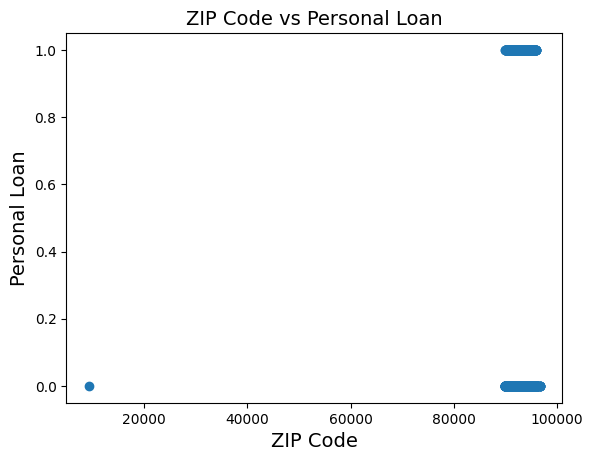

In [27]:
plt.scatter(x=df4['ZIP Code'],y=df4['Personal Loan'] )
plt.title("ZIP Code vs Personal Loan" , fontsize = 14)
plt.xlabel("ZIP Code" , fontsize = 14)
plt.ylabel("Personal Loan" , fontsize = 14)

#### Observation:
#### From plot above we can see one zip code as noise. Lets see where it is

In [28]:
small = df4['ZIP Code'].nsmallest(3)
small

384      9307
652     90005
1469    90005
Name: ZIP Code, dtype: int64

In [29]:
i = df4[df4["ZIP Code"] == 9307].index 
i

Index([384], dtype='int64')

In [30]:
df4.iloc[384:385, ]

,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
384,51,25,21,9307,4,7.2,3,0,0,0,0,1,1


#### Niose is dropped

In [31]:
df4 = df4.drop(i)

## 2.16. Extract information from zip code 

In [32]:
df4["ZIP Code"].dtypes

dtype('int64')

In [33]:
df4["ZIP Code"] = df4["ZIP Code"].astype(str)

In [34]:
df4["ZIP Code"].dtypes

dtype('O')

In [35]:
df5 = df4[["ZIP Code"]]

In [36]:
postal_codes = df5["ZIP Code"].tolist()

In [37]:
nomi = pgeocode.Nominatim('us')
us_post = nomi.query_postal_code(postal_codes)
us_post

,postal_code,country_code,place_name,state_name,state_code,county_name,county_code,community_name,community_code,latitude,longitude,accuracy
0,91107,US,Pasadena,California,CA,Los Angeles,37.0,None,NaN,34.1510,-118.0889,4.0
1,90089,US,Los Angeles,California,CA,Los Angeles,37.0,None,NaN,33.7866,-118.2987,4.0
2,94720,US,Berkeley,California,CA,Alameda,1.0,None,NaN,37.8738,-122.2549,4.0
3,94112,US,San Francisco,California,CA,City and County of San Francisco,75.0,None,NaN,37.7195,-122.4411,4.0
4,91330,US,Northridge,California,CA,Los Angeles,37.0,None,NaN,34.2283,-118.5368,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...
4994,92697,US,Irvine,California,CA,Orange,59.0,None,NaN,33.6485,-117.8387,4.0
4995,92037,US,La Jolla,California,CA,San Diego,73.0,None,NaN,32.8455,-117.2521,4.0
4996,93023,US,Ojai,California,CA,Ventura,111.0,None,NaN,34.4451,-119.2565,4.0
4997,90034,US,Los Angeles,California,CA,Los Angeles,37.0,None,NaN,34.0290,-118.4005,4.0


### 2.16.1. Check hidden characters in us_post column's name

In [38]:
for col in us_post.columns:
    print(repr(col))

'postal_code'
'country_code'
'place_name'
'state_name'
'state_code'
'county_name'
'county_code'
'community_name'
'community_code'
'latitude'
'longitude'
'accuracy'


### 2.16.2. Check missing values

In [39]:
us_post.isnull().sum()

postal_code          0
country_code        40
place_name          40
state_name          40
state_code          40
county_name         40
county_code         40
community_name    4999
community_code    4999
latitude            40
longitude           40
accuracy            40
dtype: int64

### 2.16.3. Plot zip code locations

In [40]:
# Drop rows with missing latitude or longitude
us_post_clean = us_post.dropna(subset=['latitude', 'longitude'])

# Convert DataFrame to GeoDataFrame based on latitude and longitude

us_post_clean['geometry'] = us_post_clean.apply(lambda row: Point(row['longitude'], row['latitude']), axis=1)
gdf = gpd.GeoDataFrame(us_post_clean, geometry='geometry')

# Set CRS (Coordinate Reference System) to WGS84
gdf.set_crs(epsg=4326, inplace=True)

# Initialize a map centered around [20, 0]
Postal_code_map = folium.Map(location=[20, 0], zoom_start=2)

# Add postal code locations to the map
for _, row in gdf.iterrows():

    # Ensure that place_name, state_name, and county_name exist and handle missing values
    popup_info = f"""
        Place: {row.get('place_name', 'N/A')}<br>
        State: {row.get('state_name', 'N/A')}<br>
        County: {row.get('county_name', 'N/A')}

    """
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=popup_info,
        tooltip=row.get('place_name', 'No Place Name')
    ).add_to(Postal_code_map)

# Save the map to an HTML file
Postal_code_map.save('postal_code_map.html')

# Optionally, display in a Jupyter notebook
Postal_code_map


# 3. Visualization

In [41]:
df1 = df.copy()

In [42]:
df1 = df1.drop(["ID", "ZIP Code"], axis = 1)

## 3.1. Count the number of categorical features

In [43]:
counts= {}

for i in df1[['Family', 'Education', 'Securities Account', 'CD Account', 'Online', 'CreditCard']]: 
    counts[i] = df1[i].value_counts()
    print("Value counts for {} \n".format(counts[i]))  

Value counts for Family
1    1472
2    1296
4    1222
3    1010
Name: count, dtype: int64 

Value counts for Education
1    2096
3    1501
2    1403
Name: count, dtype: int64 

Value counts for Securities Account
0    4478
1     522
Name: count, dtype: int64 

Value counts for CD Account
0    4698
1     302
Name: count, dtype: int64 

Value counts for Online
1    2984
0    2016
Name: count, dtype: int64 

Value counts for CreditCard
0    3530
1    1470
Name: count, dtype: int64 



## 3.2. Plot Pie chart for each categorical variable

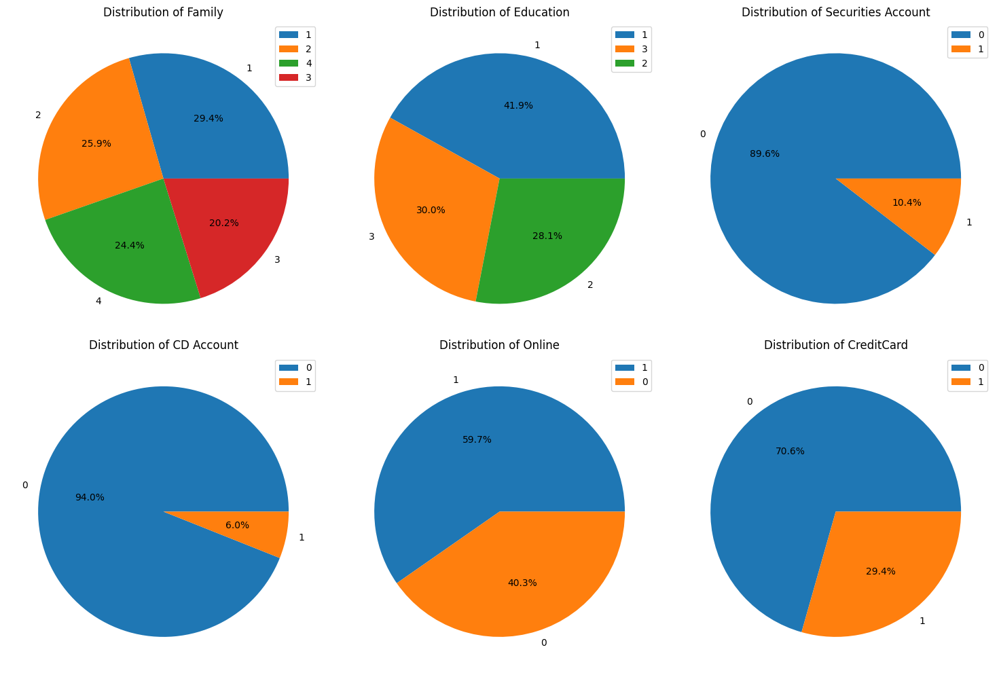

In [44]:
# Create subplots (2 rows, 3 columns)
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# List of variables to plot
variables = ["Family", "Education", "Securities Account", "CD Account", "Online", "CreditCard"]

cmap = plt.get_cmap('coolwarm')  # Gradient color map

# Loop through the variables and plot on each subplot
for idx, variable in enumerate(variables):
    row = idx // 3  # Determine the row (0 or 1)
    col = idx % 3   # Determine the column (0, 1, or 2)
    variable_counts = df1[variable].value_counts()

    # Plot pie chart on the corresponding subplot
    variable_counts.plot.pie(autopct='%1.1f%%', ax=axes[row, col], legend=True)

    # Set title for the current subplot
    axes[row, col].set_title("Distribution of " + variable)
    axes[row, col].set_ylabel('')  # Remove default ylabel for cleaner plots

# Adjust layout
plt.tight_layout()

# Display the plot
plt.show()

In [45]:
num_columns = df1[['Age', 'Experience', 'Income', 'CCAvg', 'Mortgage']]
cat_columns = df1[['Family', 'Education', 'Securities Account', 'CD Account', 'Online', 'CreditCard']]

## 3.3. Pairplot for each categorical variable

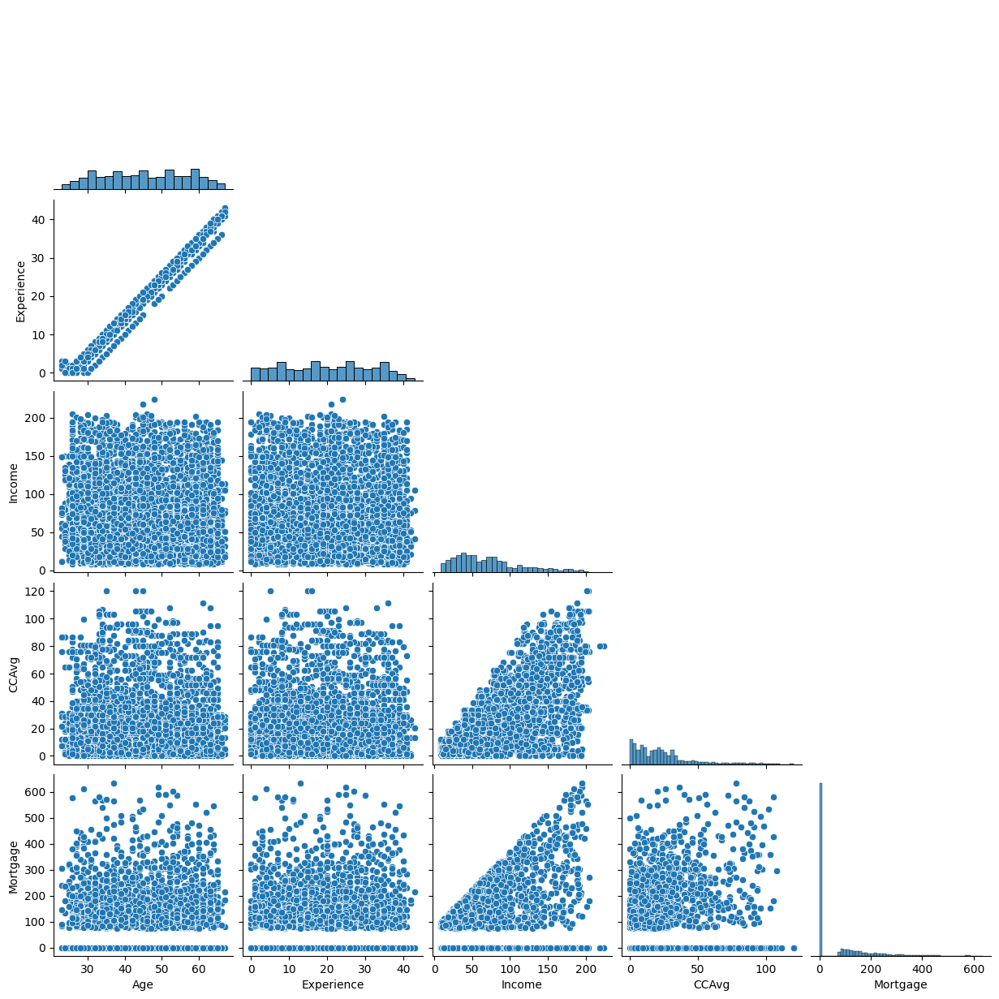

In [46]:
sns.pairplot(data = df1[['Age', 'Experience', 'Income', 'CCAvg', 'Mortgage']], palette="rocket" , corner=True)

## 3.4. Histogram plots of variables

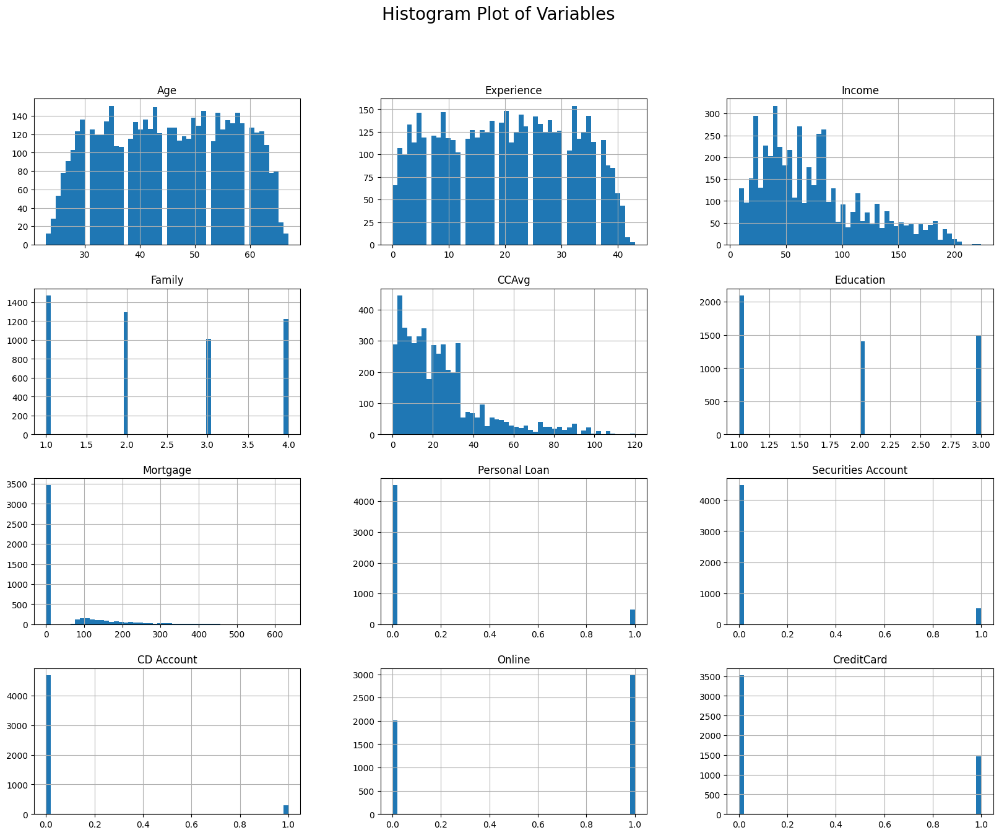

In [47]:
%matplotlib inline
df1.hist(bins=50, figsize=(20,15))
plt.suptitle("Histogram Plot of Variables", fontsize=20)
plt.show()

## 3.5. Countplot of categorical variables

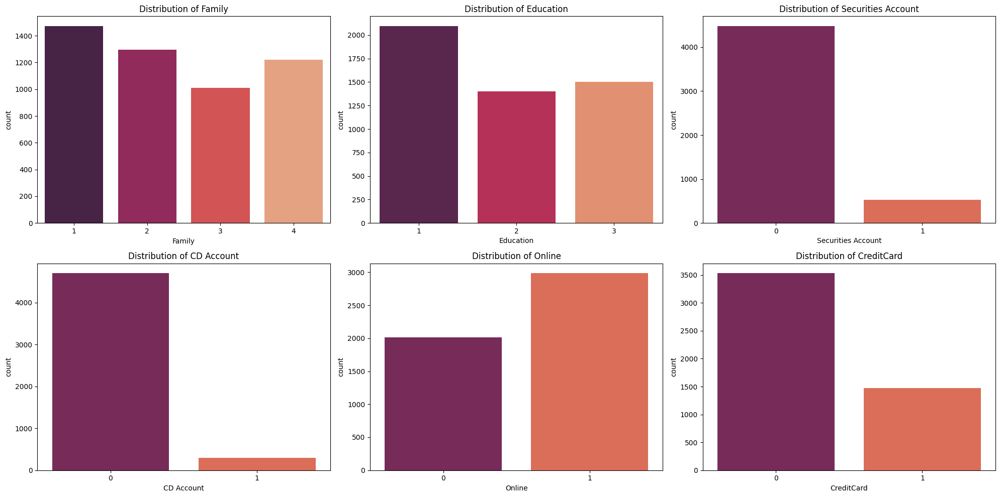

In [48]:
fig, axes = plt.subplots(2, 3, figsize=(20, 10))

for idx, col in enumerate(cat_columns):
    row = idx // 3  # Determine the row number (0 or 1)
    col_pos = idx % 3  # Determine the column number (0, 1, or 2)

    sns.countplot(data=df1, x=col, palette='rocket', ax=axes[row, col_pos])

    # Set title for each subplot
    axes[row, col_pos].set_title(f'Distribution of {col}')



# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()

## 3.6. Countplot of categorical variables vs personal loan values(0, 1)

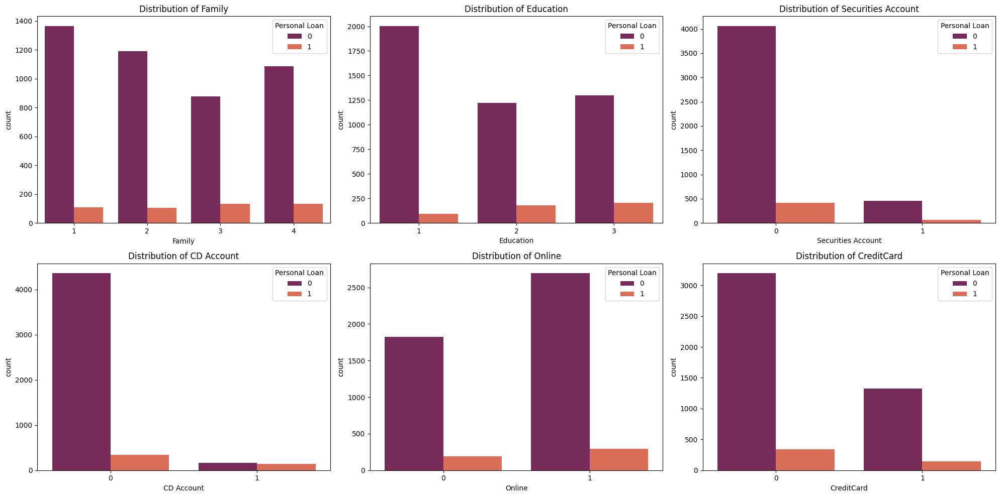

In [49]:
fig, axes = plt.subplots(2, 3, figsize=(20, 10))

for idx, col in enumerate(cat_columns):
    row = idx // 3  # Determine the row number (0 or 1)
    col_pos = idx % 3  # Determine the column number (0, 1, or 2)

    sns.countplot(data=df1, x=col, hue="Personal Loan" , palette='rocket', ax=axes[row, col_pos])

    # Set title for each subplot
    axes[row, col_pos].set_title(f'Distribution of {col}')

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()

## 3.7. Countplot of numerical variables vs personal loan values(0, 1)

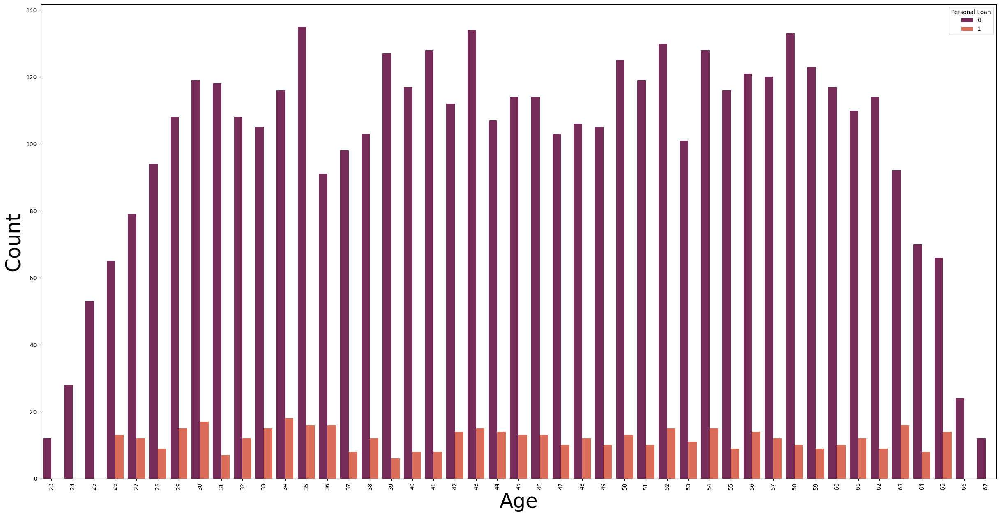

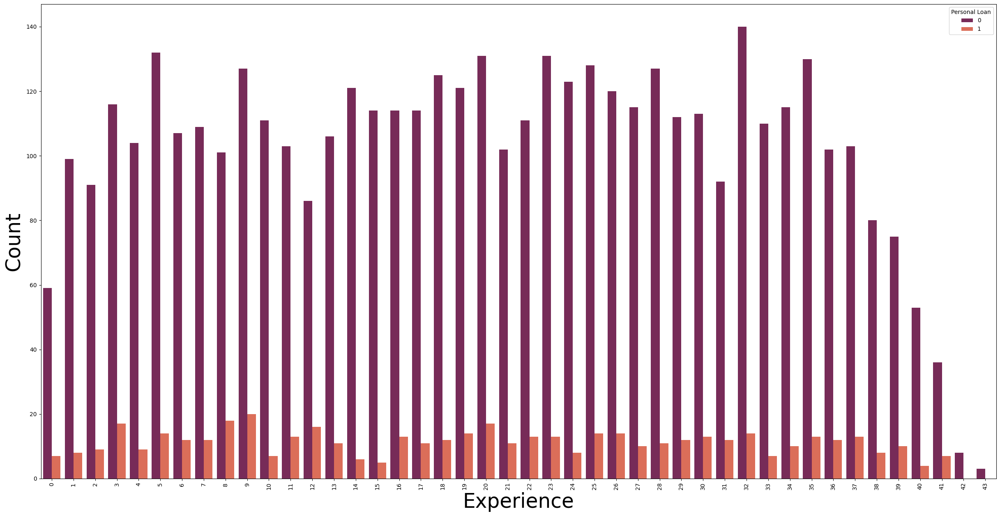

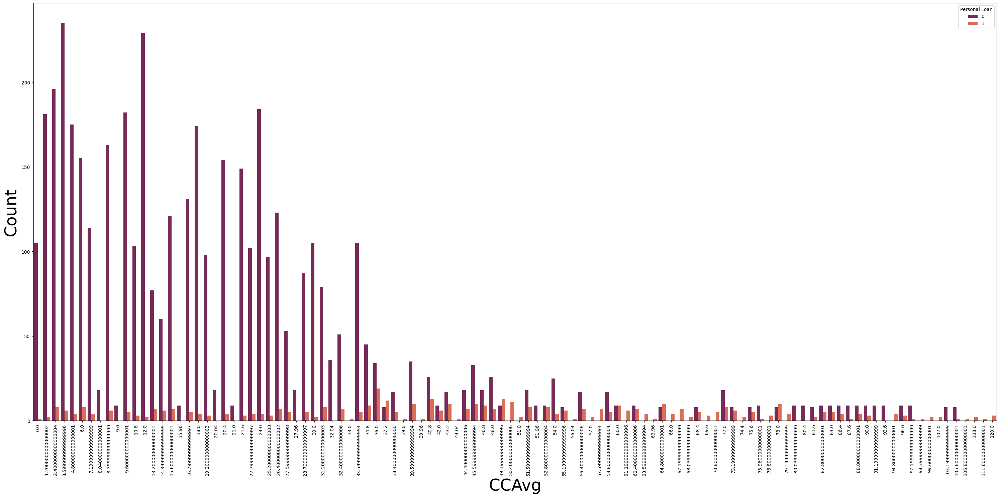

In [50]:
num_columns = ['Age', 'Experience', 'CCAvg']

# Loop through each column in num_columns

for i, col in enumerate(num_columns):  

    plt.figure(figsize=(30, 15))

    #plt.subplot(len(num_columns), 1, i + 1)  # Create subplots

    myplot = sns.countplot(data=df1, x=col, hue="Personal Loan", palette='rocket')
  

    # Rotate x-tick labels and adjust label sizes
    myplot.set_xticklabels(myplot.get_xticklabels(), rotation=90)

    # Set axis labels
    myplot.set_xlabel(col, fontsize=35)
    myplot.set_ylabel("Count", fontsize=35)

# Adjust the layout and show the plot
plt.tight_layout()
plt.show()

## 3.8. Density vs Box plot for numerical variables

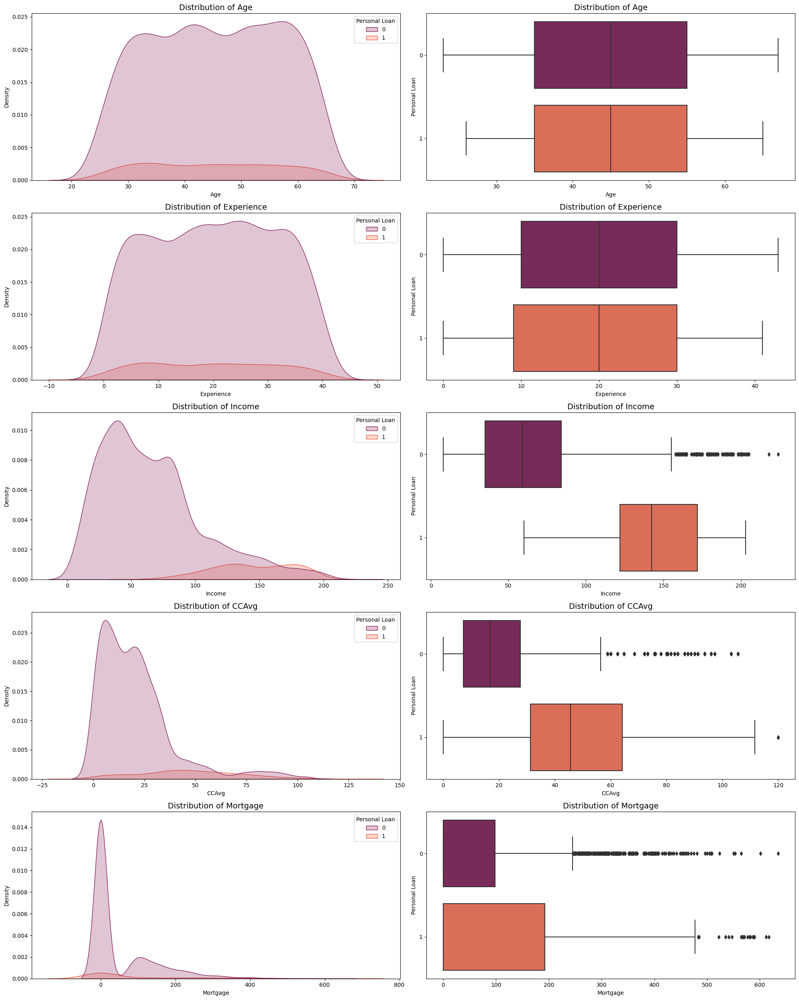

In [51]:
num_columns = ['Age', 'Experience', 'Income', 'CCAvg', 'Mortgage']
fig, axes = plt.subplots(5, 2, figsize=(20, 25))

# Loop through numerical columns
for idx, col in enumerate(num_columns):

    # Row index
    row = idx  # This is equal to the loop index for each variable

    # KDE plot (first column in the row)
    sns.kdeplot(data=df1, x=col, hue="Personal Loan", fill=True, palette="rocket", ax=axes[row, 0])

    axes[row, 0].set_title(f"Distribution of {col}", fontsize=14)

    # Boxplot (second column in the row)
    sns.boxplot(data=df1, x=col, y='Personal Loan', palette='rocket', orient='h',ax=axes[row, 1])
    axes[row, 1].set_title(f"Distribution of {col}", fontsize=14)

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()

## 3.9. Scatterplots of numerical values with each other

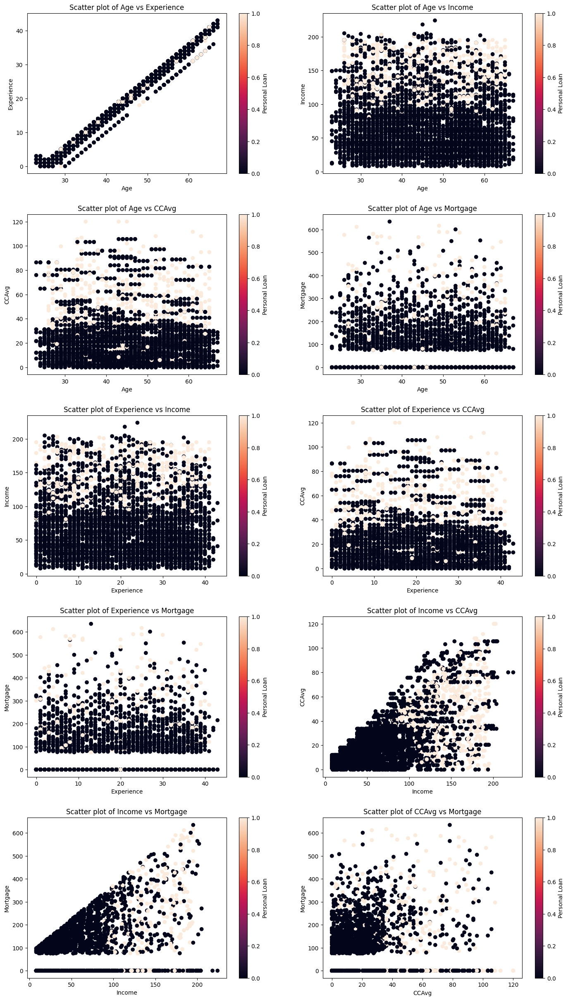

In [52]:
# Lists of column is
columns = ['Age', 'Experience', 'Income', 'CCAvg', 'Mortgage']

# Initialize subplots (5 rows, 2 columns)

fig, axes = plt.subplots(5, 2, figsize=(15, 25))  # Adjust size as needed
fig.tight_layout(pad=5)  # Adjust padding between plots

# Initialize subplot index

plot_idx = 0

# Loop through unique pairs of columns (without repetition)

for i, j in itertools.combinations(columns, 2):
    row = plot_idx // 2  # Determine the row in the grid
    col = plot_idx % 2   # Determine the column in the grid

    # Scatter plot on the respective subplot

    scatter = axes[row, col].scatter(df1[i], df1[j], c=df1['Personal Loan'], cmap='rocket')

    # Set labels and title

    axes[row, col].set_xlabel(i)
    axes[row, col].set_ylabel(j)
    axes[row, col].set_title(f'Scatter plot of {i} vs {j}')

    # Add colorbar to the plot
    plt.colorbar(scatter, ax=axes[row, col], label='Personal Loan')

    plot_idx += 1  # Increment the plot index

# Show the plot
plt.show()

## 3.10. Correlation matrix of Variables

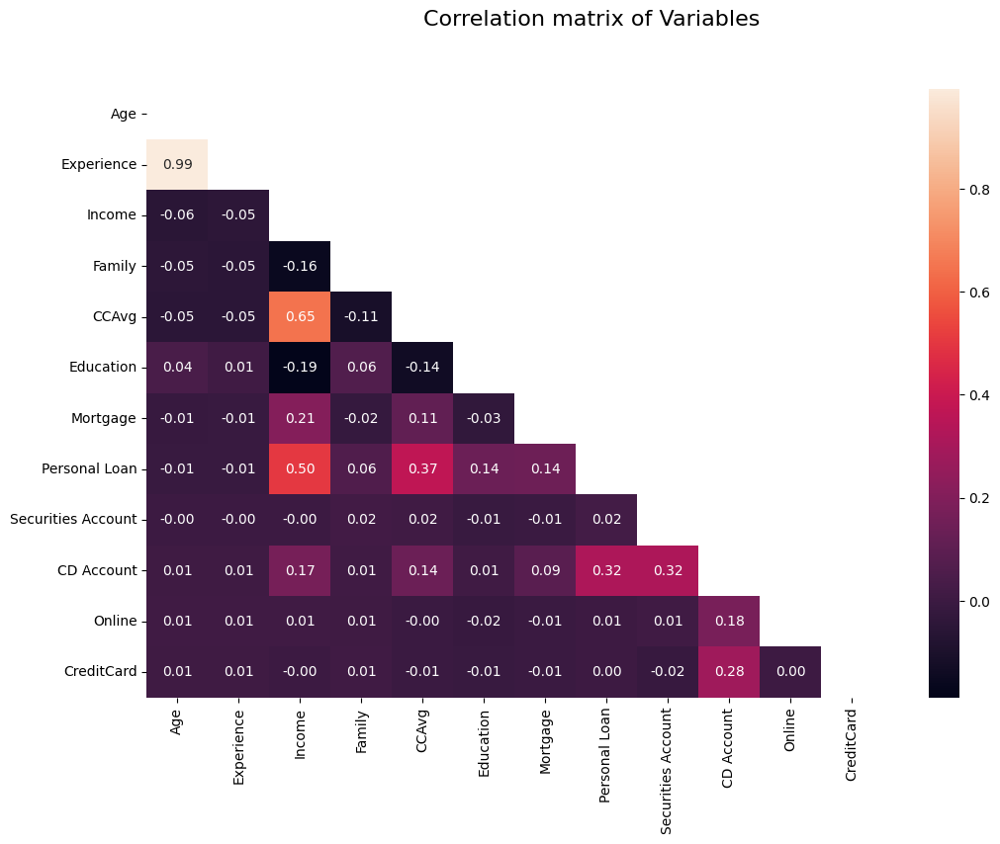

In [53]:
matrix = df1.corr()

# Create a figure with a specific size

plt.figure(figsize=(12, 8))

# Plot the heatmap with custom font sizes

sns.heatmap(matrix, cmap='rocket', fmt='.2f', mask=np.triu(matrix), annot=True, annot_kws={"size": 10})  # Control annotation font size

# Add a title with custom font size
plt.suptitle("Correlation matrix of Variables", fontsize=16)

# Control the font size of the axis tick labels
plt.tick_params(axis='both', which='major', labelsize=10)  # Adjust axis tick font size

# Show the plot
plt.show()

# 4. Merging (us_post['latitude', 'longitude']) to original dataset for further analysis

In [54]:
df1_new = pd.concat([df1, us_post[['latitude', 'longitude']]], axis=1)
df1_new.head()

,Age,Experience,Income,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard,latitude,longitude
0,25,1,49,4,19.2,1,0,0,1,0,0,0,34.1510,-118.0889
1,45,19,34,3,18.0,1,0,0,1,0,0,0,33.7866,-118.2987
2,39,15,11,1,12.0,1,0,0,0,0,0,0,37.8738,-122.2549
3,35,9,100,1,32.4,2,0,0,0,0,0,0,37.7195,-122.4411
4,35,8,45,4,12.0,2,0,0,0,0,0,1,34.2283,-118.5368


In [55]:
df1_new.shape

(5000, 14)

## 4.1. Merged dataset pre-processing

In [56]:
df1_new.isnull().sum()

Age                    0
Experience             0
Income                 0
Family                 0
CCAvg                  0
Education              0
Mortgage               0
Personal Loan          0
Securities Account     0
CD Account             0
Online                 0
CreditCard             0
latitude              41
longitude             41
dtype: int64

In [57]:
df1_new = df1_new.dropna()
df1_new = df1_new.reset_index(drop=True)

In [58]:
df1_new

,Age,Experience,Income,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard,latitude,longitude
0,25,1,49,4,19.2,1,0,0,1,0,0,0,34.1510,-118.0889
1,45,19,34,3,18.0,1,0,0,1,0,0,0,33.7866,-118.2987
2,39,15,11,1,12.0,1,0,0,0,0,0,0,37.8738,-122.2549
3,35,9,100,1,32.4,2,0,0,0,0,0,0,37.7195,-122.4411
4,35,8,45,4,12.0,2,0,0,0,0,0,1,34.2283,-118.5368
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4954,64,40,75,3,24.0,3,0,0,0,0,1,0,33.6485,-117.8387
4955,29,3,40,1,22.8,3,0,0,0,0,1,0,32.8455,-117.2521
4956,30,4,15,4,4.8,1,85,0,0,0,1,0,34.4451,-119.2565
4957,63,39,24,2,3.6,3,0,0,0,0,0,0,34.0290,-118.4005


In [59]:
df2 = df1_new.drop("Personal Loan", axis = 1)

In [60]:
df2.shape

(4959, 13)

## 4.2. Separating features and target variable

In [61]:
X = df2
y = df1_new["Personal Loan"].values.reshape(-1,1)

In [62]:
print("X shape is", X.shape)
print()
print("y shape is", y.shape)

X shape is (4959, 13)

y shape is (4959, 1)


## 4.3. Count the number of occurrences of each unique value in the target column

In [63]:
value_counts = df1['Personal Loan'].value_counts()
value_counts

Personal Loan
0    4520
1     480
Name: count, dtype: int64

## 4.4. Apply SMOTE to the entire dataset to balance target values

In [64]:
smote = SMOTE(sampling_strategy='auto', random_state=0, k_neighbors=5)

X_resampled, y_resampled = smote.fit_resample(X, y)

In [65]:
X_resampled.shape

(8976, 13)

In [66]:
y_resampled.shape

(8976,)

In [67]:
df3 = pd.DataFrame(X_resampled, columns=X.columns) 

df3['Personal Loan'] = y_resampled

In [68]:
df3.shape

(8976, 14)

In [69]:
df6 = df3.drop("Personal Loan", axis = 1)

## 4.5. Normalize Data

In [70]:
Scaler = MinMaxScaler(feature_range=(0,1))

norm1 = Scaler.fit_transform(df6)

norm1_df = pd.DataFrame(norm1, columns = ['Age', 'Experience', 'Income', 'Family', 'CCAvg', 'Education',

       'Mortgage', 'Securities Account', 'CD Account', 'Online', 'CreditCard', "latitude", 	"longitude"])

norm1_df

,Age,Experience,Income,Family,CCAvg,Education,Mortgage,Securities Account,CD Account,Online,CreditCard,latitude,longitude
0,0.045455,0.023256,0.189815,1.000000,0.160000,0.0,0.000000,1.0,0.0,0.0,0.0,0.173374,0.706987
1,0.500000,0.441860,0.120370,0.666667,0.150000,0.0,0.000000,1.0,0.0,0.0,0.0,0.133600,0.682552
2,0.363636,0.348837,0.013889,0.000000,0.100000,0.0,0.000000,0.0,0.0,0.0,0.0,0.579718,0.221795
3,0.272727,0.209302,0.425926,0.000000,0.270000,0.5,0.000000,0.0,0.0,0.0,0.0,0.562876,0.200109
4,0.272727,0.186047,0.171296,1.000000,0.100000,0.5,0.000000,0.0,0.0,0.0,1.0,0.181811,0.654822
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8971,0.250000,0.209302,0.768519,0.000000,0.266811,0.5,0.896063,0.0,0.0,1.0,0.0,0.081266,0.777930
8972,0.681818,0.651163,0.342593,0.666667,0.364025,0.5,0.000000,0.0,0.0,0.0,0.0,0.540037,0.244034
8973,0.636364,0.581395,0.462963,1.000000,0.186332,0.0,0.000000,0.0,0.0,0.0,0.0,0.298205,0.531971
8974,0.227273,0.186047,0.689815,0.333333,0.765818,1.0,0.000000,0.0,0.0,0.0,0.0,0.319796,0.587119


In [71]:
X = norm1_df

y = df3["Personal Loan"].values.reshape(-1,1)

# 5. Algorithm's Analysis

## 5.1. Logistic Regression

### 5.1.1. Apply different hyper parameters  to find the best accuracy

In [72]:
# Step 1: Split the data into training and test sets

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


# List of solvers to try in Logistic Regression

solver_list = ['liblinear', 'saga', 'lbfgs', 'newton-cg', 'sag']

# Define hyperparameter grid for logistic regression

param_grid = {

    'solver': solver_list,

    'C': [0.001, 0.01, 0.1, 1, 10],   # Regularization strength (inverse of regularization)

    'penalty': ['l1', 'l2'],           # Regularization penalty types

    'max_iter': [1000]                 # Increase iterations to ensure convergence

}

# Perform hyperparameter tuning using GridSearchCV

log_reg = LogisticRegression(random_state=0)

grid_search = GridSearchCV(log_reg, param_grid, cv=5, scoring='accuracy')

grid_search.fit(X_train, y_train)


# Get the best parameters and model

best_model = grid_search.best_estimator_


# Make predictions on the test set

y_pred = best_model.predict(X_test)


# Print performance metrics

print(f"Best Hyperparameters: {grid_search.best_params_}")

print("Accuracy:", metrics.accuracy_score(y_test, y_pred))

print("Precision:", precision_score(y_test, y_pred))

print("Recall:", recall_score(y_test, y_pred))

print("F1 Score:", f1_score(y_test, y_pred))

Best Hyperparameters: {'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'saga'}
Accuracy: 0.8930957683741648
Precision: 0.8772486772486773
Recall: 0.9160220994475138
F1 Score: 0.8962162162162163


In [73]:
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.8930957683741648


In [74]:
LR = pd.DataFrame({"Model": ["Logistic Regression"],
                   "Accuracy": [0.8930957683741648]})
LR

,Model,Accuracy
0,Logistic Regression,0.893096


In [75]:
print("Mean Absolute Error: ", metrics.mean_absolute_error(y_test, y_pred))

print("Mean Squared Error: ", metrics.mean_squared_error(y_test, y_pred))

print("Root Mean Squared Error: ", np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

print("R2 Score: ", metrics.r2_score(y_test, y_pred))

Mean Absolute Error:  0.10690423162583519
Mean Squared Error:  0.10690423162583519
Root Mean Squared Error:  0.3269621256748787
R2 Score:  0.572357088379188


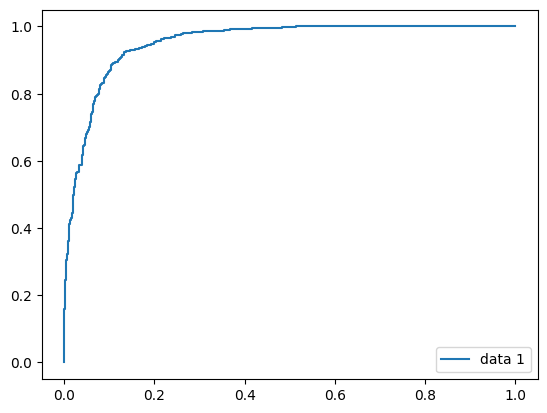

In [76]:
grid_search = GridSearchCV(log_reg, param_grid, cv=5, scoring='accuracy')

grid_search.fit(X_train, y_train)

# Use the best estimator from grid search (fitted model)

best_model = grid_search.best_estimator_

y_pred_proba = best_model.predict_proba(X_test)[:,1]

fpr, tpr, _ = metrics.roc_curve(y_test, y_pred_proba)
plt.plot(fpr, tpr, label = "data 1")
plt.legend(loc=4, fontsize=10)   
plt.tick_params(axis='both', which='major', labelsize=10)   
plt.show()

In [77]:
best_model.classes_

array([0, 1])

In [78]:
best_model.intercept_

array([-3.74595081])

In [79]:
best_model.coef_    

array([[ 0.03531192,  0.02094572,  6.86968202,  0.47702115,  2.31678109,
         1.09399535,  0.59442042, -1.37612048,  2.00661949, -1.00709462,
        -1.60244045,  0.10716859, -0.27157449]])

### 5.1.2. Confusion Matrix for dataset

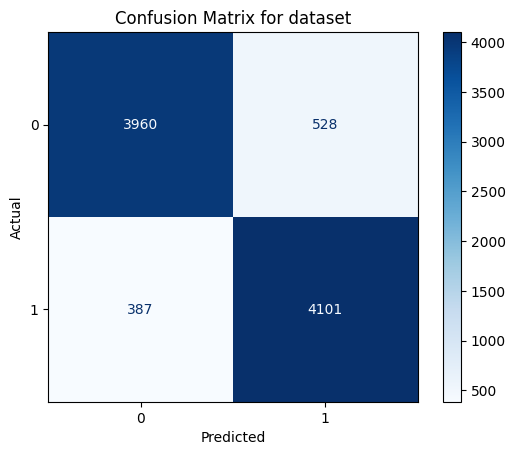

In [80]:
cm = confusion_matrix (y, best_model.predict(X))

# Plot the confusion matrix

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels= best_model.classes_)

disp.plot(cmap=plt.cm.Blues)

plt.xlabel("Predicted")

plt.ylabel("Actual")

plt.title('Confusion Matrix for dataset')

plt.show()

### 5.1.3. Confusion Matrix for test set

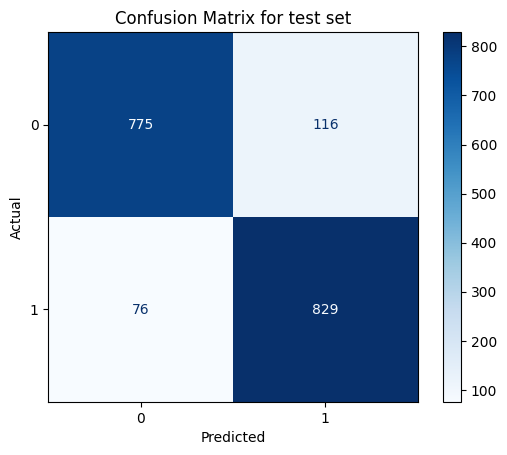

In [81]:
cm = confusion_matrix (y_test, y_pred)

# Plot the confusion matrix

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels= best_model.classes_)

disp.plot(cmap=plt.cm.Blues)

plt.xlabel("Predicted")

plt.ylabel("Actual")

plt.title('Confusion Matrix for test set')

plt.show()

### 5.1.4. Confusion Matrix report

In [82]:
cm_resampled = confusion_matrix(y, best_model.predict(X))

print("Confusion Matrix on SMOTE resampled data:")

print(cm_resampled)

# Classification Report

print("\nClassification Report:")

print(classification_report(y, best_model.predict(X)))

Confusion Matrix on SMOTE resampled data:
[[3960  528]
 [ 387 4101]]

Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.88      0.90      4488
           1       0.89      0.91      0.90      4488

    accuracy                           0.90      8976
   macro avg       0.90      0.90      0.90      8976
weighted avg       0.90      0.90      0.90      8976



### 5.1.5. Fit model with X_train, y_train

In [83]:
X = norm1_df

y = df3["Personal Loan"].values.reshape(-1,1)

In [84]:
model2 = LogisticRegression(C= 0.1, max_iter= 1000, penalty = "l2", solver = "newton-cg" , random_state=0) 

model2.fit(X_train, y_train) 

LogisticRegression(C=0.1, max_iter=1000, random_state=0, solver='newton-cg')

## 5.2. Naive Bayes

### 5.2.1. Apply different hyper parameters  to find the best accuracy

In [85]:
# Step 1: Split the data into training and test sets

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define hyperparameter grid for Naive Bayes

param_grid = {

    'alpha': [0.01, 0.1, 0.5, 1.0, 1.5, 2.0, 5.0], 

    'fit_prior' :[True, False] 

}


# Perform hyperparameter tuning using GridSearchCV

naive_b = MultinomialNB() 

grid_search = GridSearchCV(naive_b, param_grid, cv=5, scoring='accuracy')

grid_search.fit(X_train, y_train)



# Get the best parameters and model

best_model1 = grid_search.best_estimator_

# Make predictions on the test set

y_pred = best_model1.predict(X_test)


# Print performance metrics

print(f"Best Hyperparameters: {grid_search.best_params_}")

print("Accuracy:", metrics.accuracy_score(y_test, y_pred))

print("Precision:", precision_score(y_test, y_pred))

print("Recall:", recall_score(y_test, y_pred))

print("F1 Score:", f1_score(y_test, y_pred))

Best Hyperparameters: {'alpha': 0.01, 'fit_prior': False}
Accuracy: 0.8123608017817372
Precision: 0.7709923664122137
Recall: 0.8928176795580111
F1 Score: 0.8274449564772145


In [86]:
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.8123608017817372


In [87]:
NB = pd.DataFrame({"Model": ["Naive Bayes"],
                   "Accuracy": [0.8123608017817372]})
NB

,Model,Accuracy
0,Naive Bayes,0.812361


In [88]:
print("Mean Absolute Error: ", metrics.mean_absolute_error(y_test, y_pred))

print("Mean Squared Error: ", metrics.mean_squared_error(y_test, y_pred))

print("Root Mean Squared Error: ", np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

print("R2 Score: ", metrics.r2_score(y_test, y_pred))

Mean Absolute Error:  0.1876391982182628
Mean Squared Error:  0.1876391982182628
Root Mean Squared Error:  0.4331734043293318
R2 Score:  0.24939759783222037


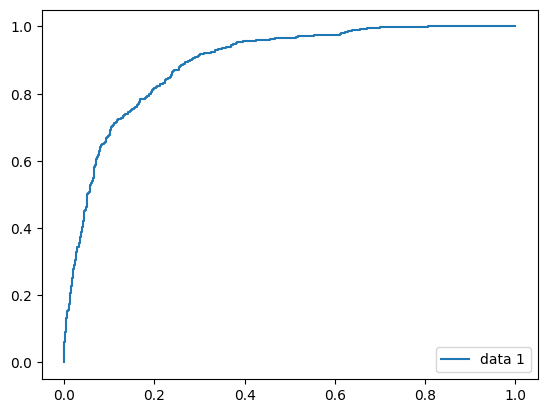

In [89]:
grid_search = GridSearchCV(naive_b, param_grid, cv=5, scoring='accuracy')

grid_search.fit(X_train, y_train)

# Use the best estimator from grid search (fitted model)

best_model1 = grid_search.best_estimator_

y_pred_proba = best_model1.predict_proba(X_test)[:,1]

fpr, tpr, _ = metrics.roc_curve(y_test, y_pred_proba)
plt.plot(fpr, tpr, label = "data 1")
plt.legend(loc=4, fontsize=10)   
plt.tick_params(axis='both', which='major', labelsize=10)   
plt.show()

In [90]:
best_model1.classes_

array([0, 1])

### 5.2.2. Confusion Matrix for dataset

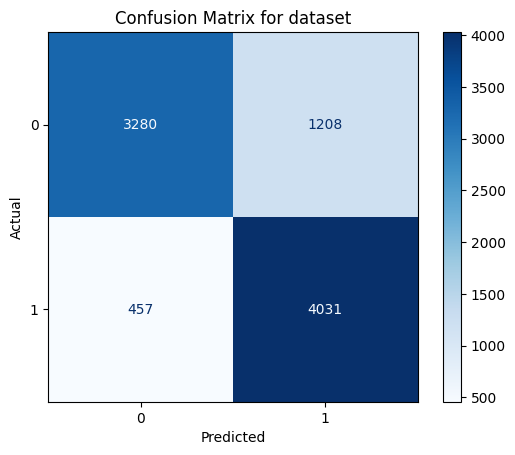

In [91]:
cm = confusion_matrix (y, best_model1.predict(X))

# Plot the confusion matrix

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels= best_model1.classes_)

disp.plot(cmap=plt.cm.Blues)

plt.xlabel("Predicted")

plt.ylabel("Actual")

plt.title('Confusion Matrix for dataset')

plt.show()

### 5.2.3. Confusion Matrix for test set

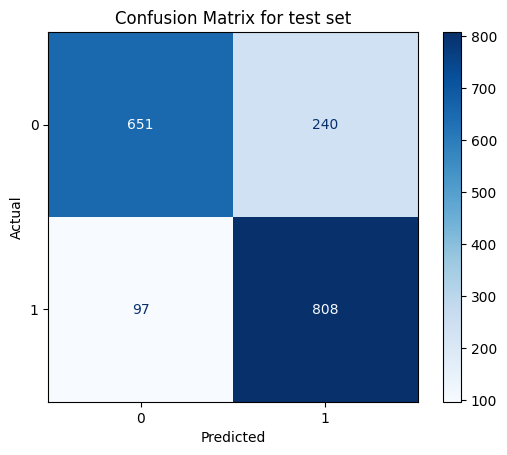

In [92]:
cm = confusion_matrix (y_test, y_pred)



# Plot the confusion matrix

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels= best_model1.classes_)

disp.plot(cmap=plt.cm.Blues)

plt.xlabel("Predicted")

plt.ylabel("Actual")

plt.title('Confusion Matrix for test set')

plt.show()

### 5.2.4. Confusion Matrix report

In [93]:
cm_resampled = confusion_matrix(y, best_model1.predict(X))

print("Confusion Matrix on SMOTE resampled data:")

print(cm_resampled)


# Classification Report

print("\nClassification Report:")

print(classification_report(y, best_model1.predict(X)))

Confusion Matrix on SMOTE resampled data:
[[3280 1208]
 [ 457 4031]]

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.73      0.80      4488
           1       0.77      0.90      0.83      4488

    accuracy                           0.81      8976
   macro avg       0.82      0.81      0.81      8976
weighted avg       0.82      0.81      0.81      8976



### 5.2.5. Fit model with X_train, y_train

In [94]:
X = norm1_df

y = df3["Personal Loan"].values.reshape(-1,1)

In [95]:
model3 = MultinomialNB(alpha=  0.01, fit_prior= False) 

model3.fit(X_train, y_train) 

MultinomialNB(alpha=0.01, fit_prior=False)

## 5.3. KNN

In [96]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [97]:
K= 15

Accuracy = np.zeros(K)

for i in range(2, K+1):

    clf = KNeighborsClassifier(i)

    clf.fit(X_train, y_train)

    y_pred = clf.predict(X_test)

    Accuracy[i-1] = (metrics.accuracy_score(y_test, y_pred))

Accuracy

array([0.        , 0.95044543, 0.94821826, 0.94599109, 0.94209354,
       0.94320713, 0.94265033, 0.94487751, 0.94265033, 0.94265033,
       0.94042316, 0.94209354, 0.93596882, 0.93541203, 0.93596882])

In [98]:
print(np.min(Accuracy))

print(np.max(Accuracy))

0.0
0.950445434298441


In [99]:
training_acc = []

test_acc = []


neighbors_setting = range (2,15)

for n_neighbors in neighbors_setting:

    knn = KNeighborsClassifier(n_neighbors = n_neighbors)    

    knn.fit(X_train, y_train)

    training_acc.append(knn.score(X_train, y_train))

    test_acc.append(knn.score(X_test, y_test))

In [100]:
test_acc

[0.950445434298441,
 0.9482182628062361,
 0.9459910913140311,
 0.9420935412026726,
 0.9432071269487751,
 0.9426503340757239,
 0.9448775055679287,
 0.9426503340757239,
 0.9426503340757239,
 0.9404231625835189,
 0.9420935412026726,
 0.9359688195991092,
 0.9354120267260579]

### 5.3.1. Accuracy of the training set vs Accuracy of the test set plot

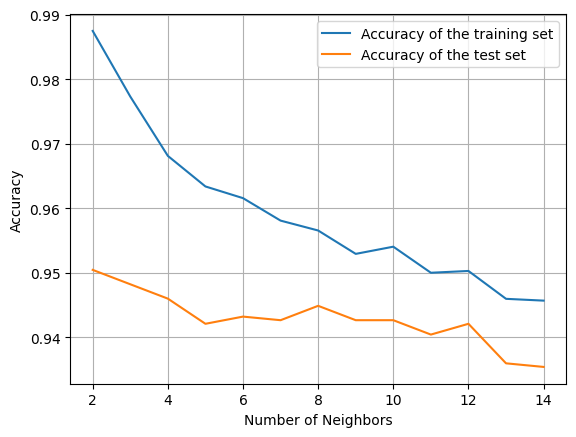

In [101]:
plt.plot (neighbors_setting, training_acc, label='Accuracy of the training set')

plt.plot(neighbors_setting, test_acc, label='Accuracy of the test set')

plt.ylabel('Accuracy')

plt.xlabel('Number of Neighbors')

plt.grid()

plt.legend()

### 5.3.2. Apply different hyper parameters to find the best accuracy

In [102]:
# Initialize KNeighborsClassifier
knn = KNeighborsClassifier()

# Hyperparameter grid
param_grid = {
    'n_neighbors': range(2, 16),  # K values from 2 to 15
    'weights': ['uniform', 'distance'],
    'p': [1, 2],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']
}

# Grid search with cross-validation
grid_search = GridSearchCV(knn, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Get the best parameters and model
best_model3 = grid_search.best_estimator_

# Make predictions on the test set
y_pred = best_model3.predict(X_test)

# Print performance metrics
print(f"Best Hyperparameters: {grid_search.best_params_}")
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Precision:", precision_score(y_test, y_pred, average='binary'))
print("Recall:", recall_score(y_test, y_pred, average='binary'))
print("F1 Score:", f1_score(y_test, y_pred, average='binary'))

Best Hyperparameters: {'algorithm': 'auto', 'n_neighbors': 2, 'p': 1, 'weights': 'distance'}
Accuracy: 0.9632516703786191
Precision: 0.9554831704668838
Recall: 0.9723756906077348
F1 Score: 0.963855421686747


In [103]:
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.9632516703786191


In [104]:
KN = pd.DataFrame({"Model": ["KNN"],
                   "Accuracy": [0.9632516703786191]})
KN

,Model,Accuracy
0,KNN,0.963252


In [105]:
print("Mean Absolute Error: ", metrics.mean_absolute_error(y_test, y_pred))

print("Mean Squared Error: ", metrics.mean_squared_error(y_test, y_pred))

print("Root Mean Squared Error: ", np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

print("R2 Score: ", metrics.r2_score(y_test, y_pred))

Mean Absolute Error:  0.036748329621380846
Mean Squared Error:  0.036748329621380846
Root Mean Squared Error:  0.19169853839135248
R2 Score:  0.8529977491303459


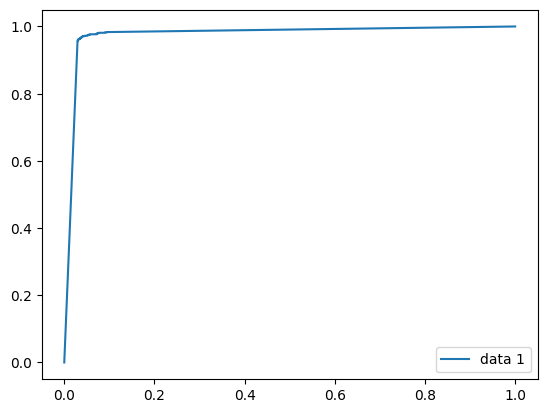

In [106]:
grid_search = GridSearchCV(knn, param_grid, cv=5, scoring='accuracy')

grid_search.fit(X_train, y_train)

# Use the best estimator from grid search (fitted model)

best_model4 = grid_search.best_estimator_

y_pred_proba = best_model4.predict_proba(X_test)[:,1]

fpr, tpr, _ = metrics.roc_curve(y_test, y_pred_proba)
plt.plot(fpr, tpr, label = "data 1")
plt.legend(loc=4, fontsize=10)   
plt.tick_params(axis='both', which='major', labelsize=10)   
plt.show()

In [107]:
best_model3.classes_

array([0, 1])

### 5.3.3. Confusion Matrix for datset

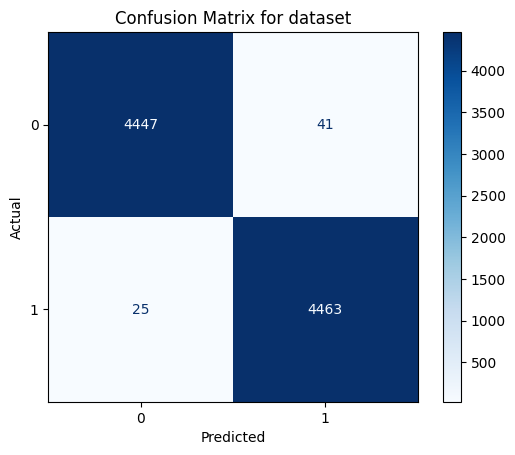

In [108]:
cm = confusion_matrix (y, best_model3.predict(X))


# Plot the confusion matrix

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels= best_model3.classes_)

disp.plot(cmap=plt.cm.Blues)

plt.xlabel("Predicted")

plt.ylabel("Actual")

plt.title('Confusion Matrix for dataset')

plt.show()

### 5.3.4. Confusion Matrix for test set

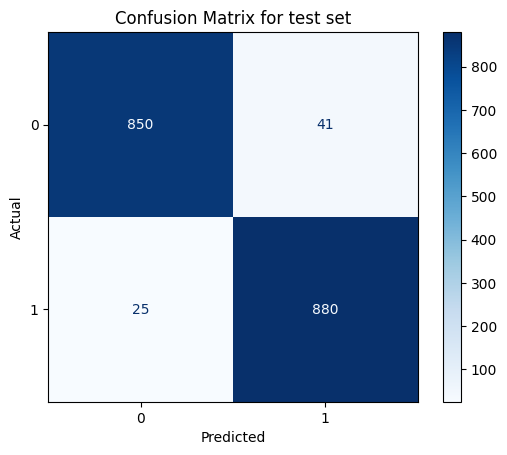

In [109]:
cm = confusion_matrix (y_test, y_pred)


# Plot the confusion matrix

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels= best_model3.classes_)

disp.plot(cmap=plt.cm.Blues)

plt.xlabel("Predicted")

plt.ylabel("Actual")

plt.title('Confusion Matrix for test set')

plt.show()

### 5.3.5. Confusion Matrix Report

In [110]:
cm_resampled = confusion_matrix(y, best_model3.predict(X))

print("Confusion Matrix on SMOTE resampled data:")

print(cm_resampled)


# Classification Report

print("\nClassification Report:")

print(classification_report(y, best_model3.predict(X)))

Confusion Matrix on SMOTE resampled data:
[[4447   41]
 [  25 4463]]

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4488
           1       0.99      0.99      0.99      4488

    accuracy                           0.99      8976
   macro avg       0.99      0.99      0.99      8976
weighted avg       0.99      0.99      0.99      8976



### 5.3.6. Fit model with X_train, y_train

In [111]:
X = norm1_df

y = df3["Personal Loan"].values.reshape(-1,1)

In [112]:
model4 = KNeighborsClassifier(algorithm='auto', n_neighbors = 2, p=1, weights='distance')

model4.fit(X_train, y_train) 


KNeighborsClassifier(n_neighbors=2, p=1, weights='distance')

# 6. Preprocessing of unseen (test) data

## 6.1. Create dataframe of unseen data

In [113]:
df6= pd.DataFrame ({"Age": [42],
                    "Experience": [16],
                    "Income" : [30],
                    "Family": [3],
                    "CCAvg": [1.2],
                    "Education":[3],
                    "Mortgage":[0],
                    "Personal Loan":[0],
                    "Securities Account" : [1],
                    "CD Account" : [0],
                    "Online" : [0],
                    "CreditCard" : [1],
                   "latitude" : [100],
                   "longitude" : [100]} )

## 6.2. Convert monthly income to annual income

In [114]:
df6["Income"] = df6["Income"]*12

## 6.3. Merge new row of unseen data to our final dataset from analysis

In [115]:
data2 = pd.concat([df3, df6], ignore_index=True)

In [116]:
data2.shape

(8977, 14)

In [117]:
data3 = data2.drop(["Personal Loan"], axis =1)

## 6.4. Normalize data

In [118]:
Scaler = MinMaxScaler(feature_range=(0,1))

norm2 = Scaler.fit_transform(data3)

norm2_df = pd.DataFrame(norm2, columns = ['Age', 'Experience', 'Income', 'Family', 'CCAvg', 'Education',

       'Mortgage', 'Securities Account', 'CD Account', 'Online', 'CreditCard', 'latitude', 'longitude'])

norm2_df

,Age,Experience,Income,Family,CCAvg,Education,Mortgage,Securities Account,CD Account,Online,CreditCard,latitude,longitude
0,0.045455,0.023256,0.116477,1.000000,0.160000,0.0,0.0,1.0,0.0,0.0,0.0,0.023554,0.027081
1,0.500000,0.441860,0.073864,0.666667,0.150000,0.0,0.0,1.0,0.0,0.0,0.0,0.018150,0.026145
2,0.363636,0.348837,0.008523,0.000000,0.100000,0.0,0.0,0.0,0.0,0.0,0.0,0.078757,0.008496
3,0.272727,0.209302,0.261364,0.000000,0.270000,0.5,0.0,0.0,0.0,0.0,0.0,0.076469,0.007665
4,0.272727,0.186047,0.105114,1.000000,0.100000,0.5,0.0,0.0,0.0,0.0,1.0,0.024700,0.025083
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8972,0.681818,0.651163,0.210227,0.666667,0.364025,0.5,0.0,0.0,0.0,0.0,0.0,0.073367,0.009348
8973,0.636364,0.581395,0.284091,1.000000,0.186332,0.0,0.0,0.0,0.0,0.0,0.0,0.040513,0.020377
8974,0.227273,0.186047,0.423295,0.333333,0.765818,1.0,0.0,0.0,0.0,0.0,0.0,0.043446,0.022489
8975,0.204545,0.139535,0.460227,0.666667,0.091223,0.5,0.0,0.0,1.0,1.0,0.0,0.018092,0.028022


## 6.5. Test data for prediction

In [119]:
X_test = norm2_df[8976:]
X_test

,Age,Experience,Income,Family,CCAvg,Education,Mortgage,Securities Account,CD Account,Online,CreditCard,latitude,longitude
8976,0.431818,0.372093,1.0,0.666667,0.01,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0


# 7. Prediction

## 7.1. Logistic Regression Prediction

In [120]:
y_pred = model2.predict(X_test)
y_pred

array([1])

## 7.2. Naive Bayes Prediction

In [121]:
y_pred1 = model3.predict(X_test)
y_pred1

array([0])

## 7.3. KNN Prediction

In [122]:
y_pred = model4.predict(X_test)
y_pred

array([0])

# 8. Models Comparison

In [123]:
comp_table = pd.concat([LR, NB, KN], ignore_index=True)
comp_table

,Model,Accuracy
0,Logistic Regression,0.893096
1,Naive Bayes,0.812361
2,KNN,0.963252


#### Observation:
#### KNN has highest accuracy among three models.

## Done!